# Day_06: Chaos in Motion 
## The double pendulum solution and mini benchmarking

Today, I wanted to build upon my recent successes with Julia and build
my own double pendulum gif. I love these examples e.g.
[wikipedia](https://upload.wikimedia.org/wikipedia/commons/thumb/e/e3/Demonstrating_Chaos_with_a_Double_Pendulum.gif/440px-Demonstrating_Chaos_with_a_Double_Pendulum.gif),
[@DatSwingyBoi](https://twitter.com/DatSwingyBoi). 

I built up the solution in 3 steps:
1. build a differential equation
2. time solutions using different solver methods
3. compile lots of solutions into one animated gif

In [1]:
using Plots, DifferentialEquations, LaTeXStrings

┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1423


## Build the double pendulum differential equations

<a title="JabberWok, CC BY-SA 3.0
&lt;http://creativecommons.org/licenses/by-sa/3.0/&gt;, via Wikimedia
Commons"
href="https://commons.wikimedia.org/wiki/File:Double-Pendulum.svg"><img
width="256" alt="Double-Pendulum"
src="https://upload.wikimedia.org/wikipedia/commons/thumb/7/78/Double-Pendulum.svg/256px-Double-Pendulum.svg.png"></a>

The double pendulum is a great example of the [butterfly
effect](https://en.wikipedia.org/wiki/Butterfly_effect). Two masses are
attached to each other by rigid connections e.g. $L_1$ and $L_2$ are
constant. They have to rotate around each other in a circle, but the
results are almost never the same. Two double pendulums with initial
conditions that are _nearly_ identical end up creating two diverging
paths. 

I used the
[Lagrangian](https://en.wikipedia.org/wiki/Lagrangian_mechanics)
approach to build the differential equations, 

- $T = \frac{1}{2}m_1v_1^2 + \frac{1}{2}m_2v_2^2$
- $V = m_1gL_1\cos\theta_1 + m_2g\left(L_1\cos\theta_1+L_2\cos\theta_2\right)$
- $L = T - V$
- $\frac{d}{dt}\left(\frac{\partial L}{\partial \dot{\theta}_i}\right) - \frac{\partial L}{\partial \theta_i} = 0$

where

- $v_1^2 = L_1^2\dot{\theta}_1^2$
- $v_2^2 = L_1^2\dot{\theta}_1^2 + L_2^2\dot{\theta}_2^2 + L_1L_2\dot{\theta}_1\dot{\theta}_2\cos\left(\theta_1 -\theta_2\right)$

It took a little patience and book-keeping, but the final equations are
two, coupled ordinary differential equations

1. $\left(m_1L_1^2 + m_2L_1^2\right)\ddot{\theta}_1 + m_2L_1L_2\cos\left(\theta_1 - \theta_2\right)\ddot{\theta}_2 +m_2L_1L_2\dot{\theta}_2^2\sin\left(\theta_1 - \theta_2) + (m_1gL_1 + m_2 g L_1\right)\sin\theta_1$
2. $m_2L_1L_2\cos\left(\theta_1 - \theta_2\right)\ddot{\theta}_1 + m_2L_2\ddot{\theta}_2 - m_2L_1L_2\dot{\theta}_1^2\sin\left(\theta_1-\theta_2\right) +m_2gL_2\sin\theta_2$

I created the function, `doublependulum`, to calculate the change in
state, `du`
$=\dot{\theta}_1,~\dot{\theta}_2,~\ddot{\theta}_1,~and~\ddot{\theta}_2$
given 

- the state, `u` $=\theta_1,~\theta_2,~\dot{\theta}_1,~and~\dot{\theta}_2$. 
- the parameters, `param` $=L_1,~L_2,~m_1,~and~m_2$
- the time, `t` _here the equations are not directly related to time though_


I collected the "mass" terms--anything multiplied by
$\ddot{\theta}_{1/2}$--and created the $2\times2$ matrix, `M`. I put everything else in the
2-element vector, `rhs`. Now, the acceleration is calculated with the [`\` operation](https://docs.julialang.org/en/v1/stdlib/LinearAlgebra/#man-linalg). 
This little, `\` operator was one of my favorite parts of MATLAB. It felt so intuitive and easy-to-use. 

```
M*du = rhs
# so
du = M\rhs
```

In [13]:
function doublependulum(u, params, t)
    g = 9.81
    du = zeros(length(u))
    l1 = params[1]
    l2 = params[2]
    m1 = params[3]
    m2 = params[4]
    
    du[1] = u[3]
    du[2] = u[4]
    M = [l1*(m1+m2) m2*l1*l2*cos(u[1] - u[2]);
        m2*l1*l2*cos(u[1] - u[2]) m2*l2]
    rhs = [-m2*l2*u[4]^2*sin(u[1] - u[2]) - (m1+m2)*g*sin(u[1]);
          m2*l1*l2*u[3]^2*sin(u[1] - u[2]) - m2*g*l2*sin(u[2])]
    du[3:4] = M\rhs
    return du
end

doublependulum (generic function with 1 method)

### Make a test run to check the differential equations

With the differential equations defined inside `doublependulum`, I built two `ODEProblems` and plotted $\theta_2$ to look for divergence. If the equations are defined correctly, I should see that the angles are very close for short times, but diverge the longer the time span. 

I chose `ODEProblem` parameters as such

- timespan 0-20 seconds, `tspan = (0, 20)`
- $L_1 = L_2 = 1~m,~and~m_1 = m_2 = 0.1~kg$, `p = [1, 1, 0.1, 0.1]`
- initial condition: release from rest at $\theta_1 = 114.59^o~and~\theta_2 = 114.59^o~and~114.65^o$, `[2, 2, 0, 0]` and `[2, 2.001, 0, 0]` _a difference of $\approx 3~min~or~\frac{3}{60}~degrees$

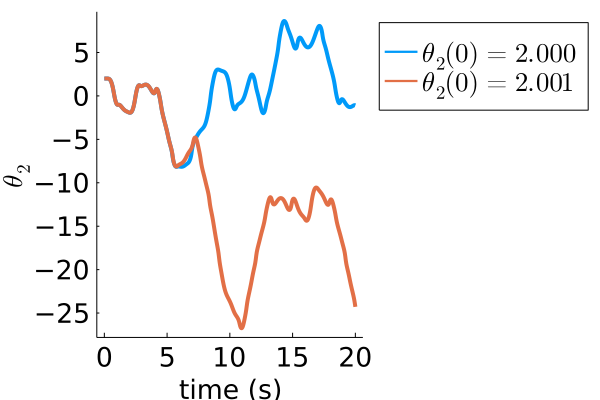

In [14]:
Plots.theme(:cooper)
tspan = (0, 20);
p = [1, 1, 0.1, 0.1];
prob1 = ODEProblem(doublependulum, [2, 2, 0, 0], tspan, p)
sol1 = solve(prob1)
prob2 = ODEProblem(doublependulum, [2, 2.001, 0, 0], tspan, p)
sol2 = solve(prob2)

X = zeros()

t = range(0, tspan[2], 500)
a21 = [sol1(ti)[2] for ti in t]
a22 = [sol2(ti)[2] for ti in t]

plot(t, a21, label = L"$\theta_2(0) = 2.000$")
plot!(t, a22,  label = L"$\theta_2(0) = 2.001$",
    xlabel = "time (s)", 
    ylabel = L"$\theta_2$")

Around 6-7 seconds into the prediction, the two solutions diverge. **Success**.

## Time the solutions to the double pendulum

Since, I want to compare _lots_ of solutions, I wanted to try out the [`@timed`](https://docs.julialang.org/en/v1/base/base/#Base.@timed) function and compare a few different integration methods. 

> __Note__: This is not a full "benchmarking" analysis. I am not tweaking parameters to compare apples-to-apples here, I'm just blindly running and choosing the fastest result. Your mileage _will_ vary. The [`BenchmarkTools`](https://github.com/JuliaCI/BenchmarkTools.jl) look much more capable of building insights into these results, but here I'm starting simple.

I looked at the [Three Body Work-Precision](https://benchmarks.sciml.ai/html/NonStiffODE/ThreeBody_wpd.html) methods and picked out some possible ODE integration methods, 

- `Tsit5()`: Tsitouras 5/4 Runge-Kutta method. (free 4th order interpolant).
- `BS3()`: Bogacki-Shampine 3/2 method
- `BS5()`: Bogacki-Shampine 5/4 method
- `Vern6()`: Verner's "Most Efficient" 6/5 Runge-Kutta method. (lazy 6th order interpolant).
- `Vern9()`: Verner's "Most Efficient" 9/8 Runge-Kutta method. (lazy 9th order interpolant)
- `DP5()`: Dormand-Prince's 5/4 Runge-Kutta method. (free 4th order interpolant).

> __Note__: for more integration options and explanations, check the [DifferentialEquations ODE Solvers](https://diffeq.sciml.ai/stable/solvers/ode_solve/) page.

I set up the `ODEProblem` as the `doublependulum` with $\theta_1 = \theta_2 = 2~rad$ starting from rest i.e. `[2, 2, 0, 0]`. The pendulum lengths and masses are $L_1 = L_2 = 1~m$ and $m_1 = m_2 = 0.1~kg$.

In [6]:
tspan = (0, 20);
p = [1, 1, 0.1, 0.1];
prob = ODEProblem(doublependulum, [2, 2, 0, 0], tspan, p)

ODEProblem with uType Vector{Int64} and tType Int64. In-place: false
timespan: (0, 20)
u0: 4-element Vector{Int64}:
 2
 2
 0
 0

I made a list of methods to try in `methods` and then compiled 100 trials, `Nruns = 100`. The statistics for each timed run was saved inside `stats` using two list comprehensions, 

1. for each run `range(1, Nruns)` I timed the given `solutions_method(method)`
2. repeat for each `method` contained in `methods`

```julia
function solution_method(method)
    sol = solve(prob, method)
#     print(sol[end][2])
end
# @time solution_method()
Nruns = 100
methods = [Tsit5(), BS3(), BS5(), Vern6(), Vern9(), DP5()]
stats = [[@timed solution_method(method) for i in range(1, Nruns)] for method in methods];
```

I compared the times and memory useage by printing out the mean and standard deviations across the 100 evaluations, 

```julia
for (i, m) in enumerate(methods)
    avgT = mean([stats[i][j].time for j in range(1, Nruns)])
    sigT = std([stats[i][j].time for j in range(1, Nruns)])
    avgB = mean([stats[i][j].bytes for j in range(1, Nruns)])
    sigB = std([stats[i][j].bytes for j in range(1, Nruns)])
    print(split(string(m), "(")[1],"| avg time = ", avgT, "+/-", sigT,"\n")
    print(split(string(m), "(")[1],"| avg size = ", avgB, "+/-", sigB,"\n")
end

out: 
Tsit5| avg time = 0.03184966183000001+/-0.295094360432862
Tsit5| avg size = 9.97361955e6+/-7.383699550000001e7
BS3| avg time = 0.029934179349999993+/-0.2703186488655862
BS3| avg size = 1.017238704e7+/-7.216387040000002e7
BS5| avg time = 0.044493667269999995+/-0.4209777166311047
BS5| avg size = 1.239656072e7+/-1.0026528719999999e8
Vern6| avg time = 0.04626529728999999+/-0.4281718618312509
Vern6| avg size = 1.410242284e7+/-1.0272486840000002e8
Vern9| avg time = 0.08686764361999998+/-0.8185455220658197
Vern9| avg size = 1.740738218e7+/-1.1960118179999997e8
DP5| avg time = 0.009356491289999998+/-0.07042112542403473
DP5| avg size = 3.40718885e6+/-7.580208500000002e6
```

These results weren't very pretty, but they do contain a lot of information. Next, I use a [`boxplot`](https://goropikari.github.io/PlotsGallery.jl/src/boxplot.html) of the results. 

```julia 
using StatsPlots
boxplot([[stats[i][j].time for j in range(1, Nruns)] for i in range(1, length(methods)) ], 
    label = "", ylim = (0, :auto))#[split(string(m), "(")[1] for m in methods])
plot!(xticks = (range(1, 6), [split(string(m), "(")[1] for m in methods]))
```

![image.png](./timed-methods-auto.png)

The outliers swamp the average and standard deviations of these runs, so here I set the `ylim` to 5 ms. 

```julia
boxplot([[stats[i][j].time for j in range(1, Nruns)] for i in range(1, length(methods)) ], 
    label = "", ylim = (0, 0.005))#[split(string(m), "(")[1] for m in methods])
plot!(xticks = (range(1, 6), [split(string(m), "(")[1] for m in methods]))
```

![image.png](timed-methods-close.png)

Now, I can see that the two fastest methods are `Tsit5()` and `DP5()`. There was no significant difference between these two methods. I'm sure there are methods to get even better results, but the methods blazingly fast and efficient for this little 2DOF nonlinear problem.

## Compile lots of solutions into one gif

Finally, I have 
- physics of the doublependulum defined in `doublependulum`
- timing results to choose `DP5()` as my integration routine

Now, I want to save my results in a useable format so I can plot and animate the chaos effect in multiple double pendulums with slightly varying initial conditions. I use an array-based organization of my results:

- given the three coordinates describing the hinge locations (0, 0), (X_1, Y_1), and (X_2, Y_2)
- the number of timesteps, `timesteps = 500`
- the number of pendulums, `Npendulums = 100`

I create two 3D arrays with dimension lengths that match the number of coordinates, timesteps, and number of pendulums:

- `X = zeros(3, timesteps, Npendulums)` 
- `Y = zeros(3, timesteps, Npendulums)` 

So, if I want to plot the position of the 10th pendulum in the first timestep, I can use the plot command, 

`plot(X[:, 1, 10], Y[:, 1, 10])`

or I could plot the path taken by the second hinge, which should be a semicircle. 

`plot(X[2, :, 10], Y[2, :, 10])`

Each of the dimensions for `X` and `Y` are `<hinge #>, <timestep>, <pendulum #>`.

In [8]:
tspan = (0, 20);
p = [1, 1, 0.1, 0.1];

Npendulums = 100
timesteps = 500
dtheta2 = range(0, 0.001, Npendulums);
t = range(0, tspan[2], timesteps);
X = zeros(3, timesteps, Npendulums);
Y = zeros(3, timesteps, Npendulums);

Here, I loop through and store the solutions into `X` and `Y`. 
- `theta2_0` is the initial angle for $\theta_2$. It varies from 2-2.001 radians
- `prob` defines the differential equation, including its initia; conditions, timespan and parameters
- `sol_dp5` is the integration result from the `DP5()` method
- `sol` interpolates the results to the same timesteps, `t = range(0, 20, timesteps)`
- `x1, y1, x2, y2` are the hinge positions, $[L_1\sin\theta_1,~-L_1\cos\theta_1]$ and $[L_1\sin\theta_1+L_2\sin\theta_2,~-L_1\cos\theta_1-L_2\cos\theta_2]$

In [9]:
for pend_i in range(1, Npendulums)
    theta2_0 = 2 + dtheta2[pend_i]
    prob = ODEProblem(doublependulum, [2, theta2_0, 0, 0], tspan, p)
    sol_dp5 = solve(prob, DP5())
    sol = sol_dp5(t)
    x1 = [p[1]*sin(sol.u[i][1]) for i in range(1, timesteps)]
    x2 = [p[1]*sin(sol.u[i][1]) + p[2]*sin(sol.u[i][2]) for i in range(1, timesteps)]
    y1 = [-p[1]*cos(sol.u[i][1]) for i in range(1, timesteps)]
    y2 = [-p[1]*cos(sol.u[i][1]) - p[2]*cos(sol.u[i][2]) for i in range(1, timesteps)]
    X[2, :, pend_i] = x1
    X[3, :, pend_i] = x2
    Y[2, :, pend_i] = y1
    Y[3, :, pend_i] = y2
end

I want to color code each pendulum and path. Here, I use the `ColorSchemes` to set the colors for the pendulums. Using 10 pendulums, I would have these 10 colors from the `rainbow` scheme.

In [10]:
import ColorSchemes.rainbow
get(rainbow, range(0, 1, length = 10))

### Plot the gif frames

I took some time to build a nice dynamic and customizable plot. There are a lot of lines to get it to look the way I wanted. Walking through the steps of the `@gif` loop, 
1. the `for`-loop increments the `tend` value from the second timestep through the final timestep, `timesteps = 500`
2. initialize the plot with 
    - a title `"Chaos in motion"`
    - equal axes, `xlim = ylim` and `aspect_ratio = :equal`
    - remove axes `axis = nothing` and `showaxis = false`
3. show the last 100-steps in the path of the pendulum if the current time is greater than 100 steps
    - `if tend < pathlength+1` when `tend` is less than the `pathlength = 100` just plot all of the points, tstart = 1
    - `else` when tend is more than `pathlength = 100` plot the last 100 values, `tstart = tend - 100`
4. Set the color of the current pendulum: `pend_color = get(rainbow, (pend_i-1)/(Npendulums - 1))` scale goes 0-1 for `get`
4. Plot each pendulum at the current time and its path `for pend_i in range(1, Npendulums)`
    - plot the path of the end of the pendulums: `plot!(X[3, tstart:tend, pend_i], Y[3, tstart:tend, pend_i)`
    - Fade out old path values by setting the opacity to vary from 1=current time, to 0=100 timesteps backward: `seriesalpha = range(0, stop=1, length = 1+tend-tstart))`
    - plot the current pendulum shape: `plot!(X[1:3, tend, pend_i], Y[1:3, tend, pend_i])`
    - add markers for the pendulums: `markershape = :circle, markercolor = pend_color, markeralpha = 0.5`

┌ Info: Saved animation to 
│   fn = /home/ryan/Documents/Career_docs/cooperrc-gh-pages/Julia-learning/tmp.gif
└ @ Plots /home/ryan/.julia/packages/Plots/D9pfj/src/animation.jl:114


Plots.AnimatedGif("/home/ryan/Documents/Career_docs/cooperrc-gh-pages/Julia-learning/tmp.gif")
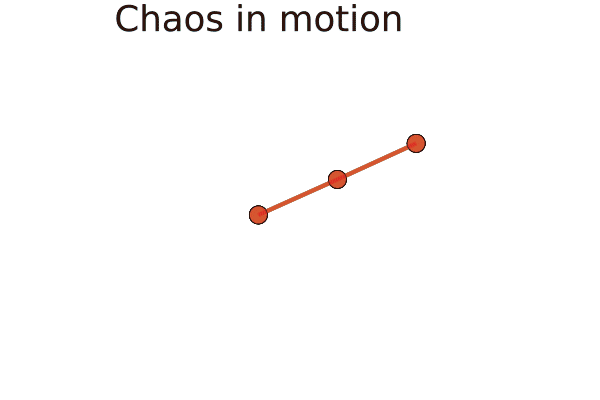

In [11]:
Npendulums = 10
pathlength = 100
@gif for tend in range(2, timesteps)
    p = plot(title = "Chaos in motion", 
        xlim = (-2, 2), 
        ylim = (-2, 2),
    aspect_ratio = :equal,
    axis = nothing,
    showaxis = false)
    if tend < pathlength+1
        tstart = 1
    else
        tstart = tend - pathlength
    end
    for pend_i in range(1, Npendulums)
        pend_color = get(rainbow, (pend_i-1)/(Npendulums-1))
        plot!(X[3, tstart:tend, pend_i], Y[3, tstart:tend, pend_i], 
            label ="",
        linecolor = pend_color,
        seriesalpha = range(0, stop=1, length = 1+tend-tstart))
        plot!(X[1:3, tend, pend_i], Y[1:3, tend, pend_i], markershape = :circle, 
            label = "",
        linecolor = pend_color,
            linealpha = 0.5,
        markercolor = pend_color,
        markeralpha = 0.5)
    end
end

Setting the number of pendulums to the full `Npendulums = 100` solutions, I get

![100 double pendulums with diverging paths](./100-pendulums.gif)

## Wrapping up

I love these double pendulum animations and Julia is amazing for building these solutions and visualizing the data. The `@timed` function is a great debugging tool, but in the end the longest "computer time" is going to be limited by the visualization process. There may be better/faster ways to plot complex data, but _I think_ it will always be a big bottleneck. Julia was able to integrate two second order coupled differential equations in <2 ms, so x100 is still under 0.2 sec. Compiling the `@gif` images on top of each other takes ~5-10 sec wall time. 

Julia feels like home. It has many of the numerical tools I loved in MATLAB e.g. `\`, the openness and readability of Scientific Python packages, and the speed of C/C++ _or, in my case Fortran which I used in grad school_. I'm excited to build upon these solutions and continue learning about Julia.